# Домашнее задание 3

1) [1 балл] Реализуйте чтение изображений, лежащих в /data/imgs/arrow (как в демо с калибровкой камеры с семинара). Вся обязательная часть задания выполняется с этими изображениями

1) [2 балла] Реализуйте нахождение расстояния от камеры до листка, учитывая, что это тот же листок, что был в первом демо

2) [3 балла] Реализуйте приведение изображения листка к "виду сверху"

3) [6 баллов] Реализуйте определение направления, в котором указывает стрелка. Можно использовать скелетонизацию из первого семинара по зрению: получить маску темной области (стрелки) внутри изображения листка, применить скелетонизацию, вычислить направление. Можно поступить иначе: после нахождения маски вычислить градиенты Собеля по x и y и проанализировать их направления. P.S. Можно использовать и полностью свой метод

4) [3 балла] Доп. задача 1: Примените написанный Вами код к видео https://drive.google.com/file/d/1AQhg2lL5FL4edlOcxY2SHOOZ-v9TgHBD/view?usp=sharing. Загрузите видео на свой гугл диск, а затем дополните имеющийся код монтированием диска и чтением в цикле кадров видео, приведёнными в конце семинара

5) [5 баллов] Доп. задача 2: определите, нормально ли видно листок в кадре. На некоторых кадрах его видно не полностью, один или больше уголков находятся за кадром. Это можно автоматически обнаруживать, к примеру используя размеры стрелки, и выводить на соответствующем кадре маркер - текст или цветную метку

## Setup

In [1]:
import numpy as np
import cv2
import time
import os
import math
import sys
import glob
from copy import *
from matplotlib import pyplot as plt
from random import randint
plt.rcParams["figure.figsize"] = (10,10)

## Task #1

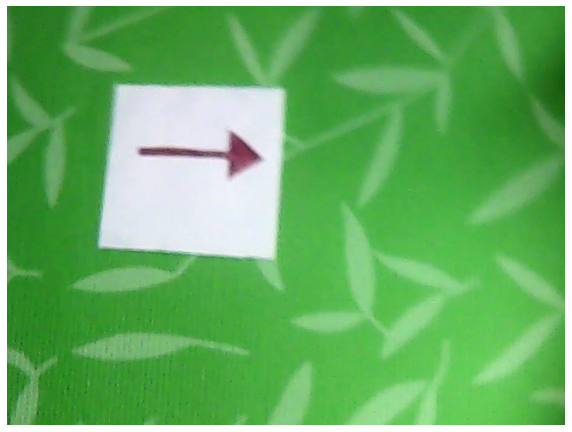

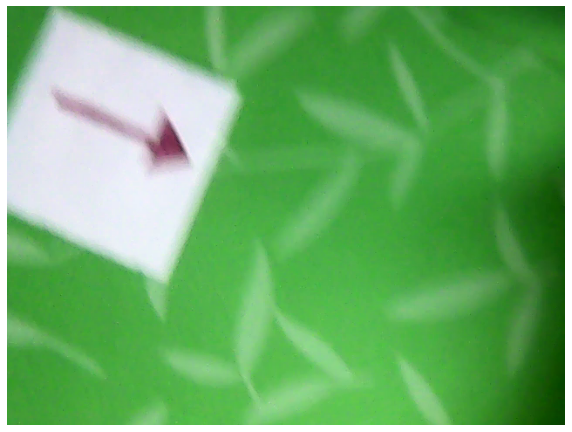

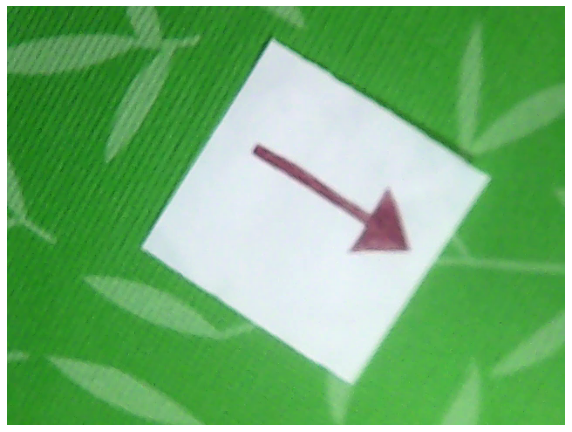

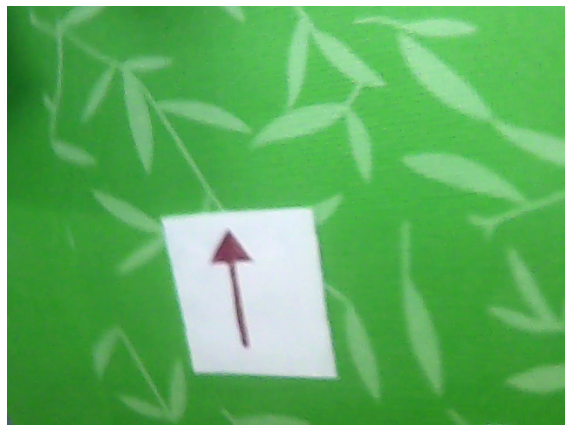

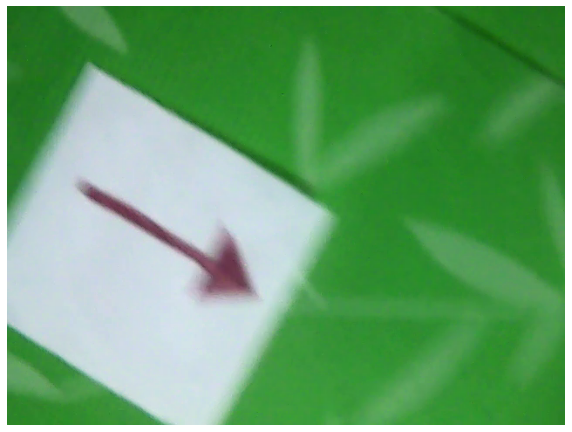

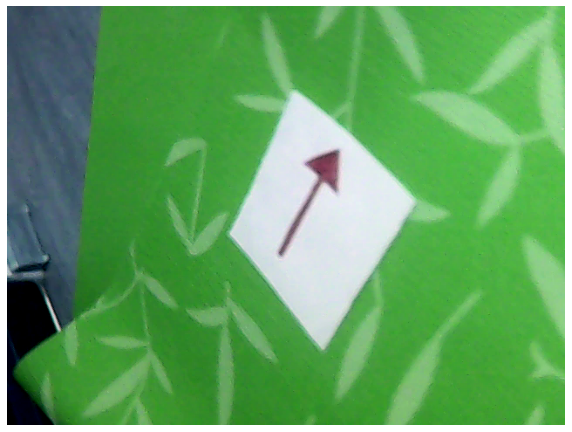

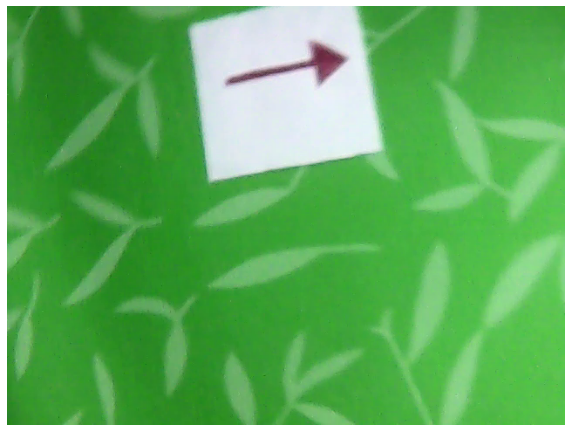

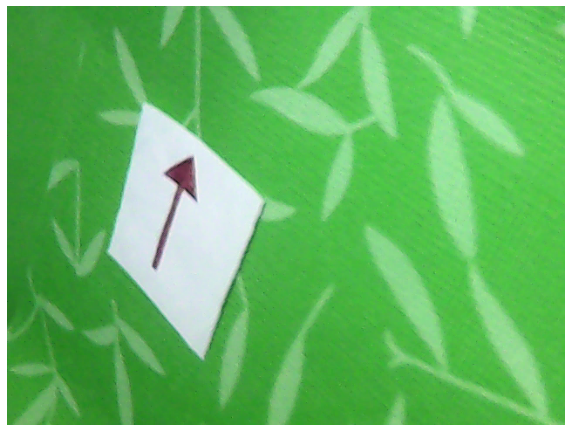

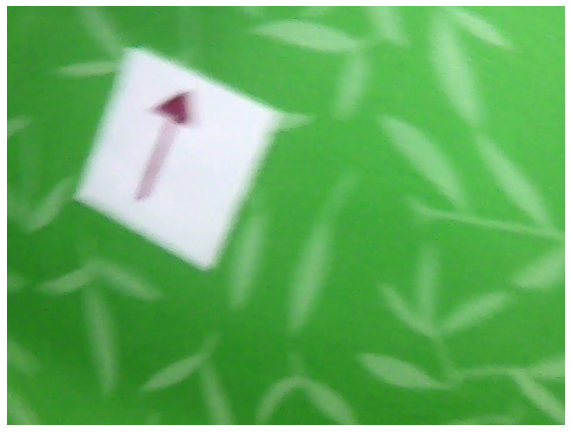

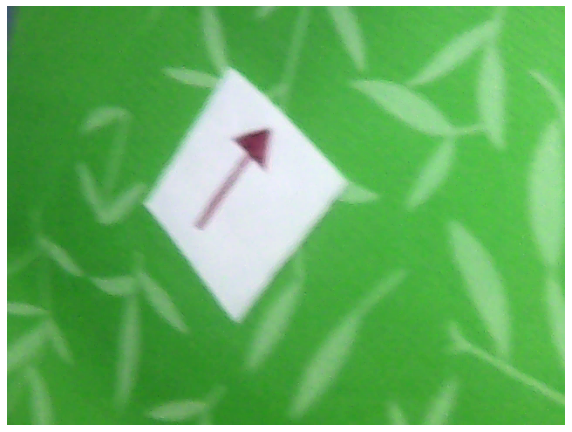

In [2]:
fnames = glob.glob("../data/imgs/arrow/*.png")

images = []

for fname in fnames:
    img = cv2.imread(fname)
    images.append(img)
    plt.imshow (img)
    plt.axis ('off')
    plt.show ()

## Task #2

Код с семинара не работал на всех картинках. Добавил размытие и немного понизил нижний порог цвета. Заработало.
Понятно, что для изображений с обрезанными углами значения будут неточными.
Не очень понятна формула для нахождения расстояния (см. ниже).

In [3]:
low_th  = (180, 180, 180)
high_th = (255, 255, 255)

In [4]:
def find_contour (img, low_th, high_th):
    
    #img_rgb = cv2.cvtColor (img, cv2.COLOR_BGR2RGB) # Преобразование в RGB тут явно лишнее: оно не обязательно
                                                     # для нынешних задач, да и все остальное далее мы делаем в BGR.
                                                     # В других задачах путаница с цветом может быть фатальна.
                                                     # Так что далее я буду работать в BGR по умолчанию.
    
    img = cv2.GaussianBlur(img, (5,5), cv2.BORDER_DEFAULT) #  Добавил размытие
    
    mask = cv2.inRange (img, low_th, high_th) #Поменял
    #                      ^
    #Здесь было изображение в BGR, а не в RGB, в котором мы работем в этой функци.
    #Далее я буду использовать только BGR, чтобы не было потенциальных ошибок
    
    # Разобрался с вторым и третьим параметрами
    contours, hierarchy = cv2.findContours (mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    cnt = contours [0]

    approx = cv2.convexHull (cnt)

    epsilon = 0.05 * cv2.arcLength (approx, True)
    
    # Для нагядности еще это отрисовал
    approx = cv2.approxPolyDP (approx, epsilon, True)
    
    #plt.imshow (img)
    #plt.show ()
    
    #plt.imshow (mask)
    #plt.show ()
    
    #cntrs_image = cv2.drawContours(img, cnt, -1, (0,255,0), 5)
    #plt.imshow (cntrs_image)
    
    cntrs_image = cv2.drawContours(img, approx, -1, (0,0,255), 5)
    plt.axis ('off')
    plt.imshow (cntrs_image)
    plt.show ()
    
    return approx

In [5]:
def find_distance (img):

    contour = find_contour (img, low_th, high_th)
    
    length = cv2.arcLength (contour, True)
    
    # Предположу, что тут имеется в виду distance = focal_dist * real_perimeter / rect_on_image_perimeter   
    distance = 180.0 * 364 / length
    
    return distance

In [6]:
'''
i = 0
for image in images:
    print("distance #"+str(i)+" = " + str(find_distance(image)))
    print("-------------------------------------------------------------------")
    i += 1
'''

'\ni = 0\nfor image in images:\n    print("distance #"+str(i)+" = " + str(find_distance(image)))\n    print("-------------------------------------------------------------------")\n    i += 1\n'

## Task #3

Код с семинара работал не для всех картинок, проблема была в order_points. Пояснения в комментариях.

In [7]:
def order_points(pts):
    # rect = [tl, tr, br, bl]
    rect = np.zeros((4, 2), dtype="float32")
    
    # Проблема: если граница почти параллельна прямой x=y, то bl может стать равным br, а tr - равным tl.
    
    s    = pts.sum(axis=1)
    diff = np.diff(pts, axis=1) 
    
    rect[0] = pts[np.argmin(s)]
    rect[2] = pts[np.argmax(s)]
    
    
    rect[1] = pts[np.argmin(diff)]
    rect[3] = pts[np.argmax(diff)]
    
    return rect

In [8]:
def new_order_points(hull):
    
    # Если почитать документацию cv2.convexHull, то можно узнать, что полученные ею точки расположены против часовой стрелки. Это я и ипользую.
    
    i_min = 0
    for i in range(len(hull)):
        if hull[i][0]**2 + hull[i][1]**2 < hull[i_min][0]**2 + hull[i_min][1]**2:
            i_min = i
        
        
    tl = hull[i_min]
    tr = hull[(i_min + 1)%4]
    br = hull[(i_min + 2)%4]
    bl = hull[(i_min + 3)%4]
        
    # rect = [tl, tr, br, bl]
    rect = np.zeros((4, 2), dtype="float32")
    
    rect[0] = tl
    rect[1] = tr
    rect[2] = br
    rect[3] = bl
    
    return rect

In [9]:
def four_point_transform(image, pts):
    
    rect = new_order_points(pts)
    (tl, tr, br, bl) = rect
    
    corners = copy(image)
    draw_text(corners, "tl", tuple(map(int, tl)), 2)
    draw_text(corners, "tr", tuple(map(int, tr)), 2)
    draw_text(corners, "br", tuple(map(int, br)), 2)
    draw_text(corners, "bl", tuple(map(int, bl)), 2)
    
    plt.imshow (corners)
    plt.axis ('off')
    plt.show ()
    
    widthA = np.sqrt(((br[0] - bl[0]) ** 2) + ((br[1] - bl[1]) ** 2))
    widthB = np.sqrt(((tr[0] - tl[0]) ** 2) + ((tr[1] - tl[1]) ** 2))
    maxWidth = max(int(widthA), int(widthB))
    
    heightA = np.sqrt(((tr[0] - br[0]) ** 2) + ((tr[1] - br[1]) ** 2))
    heightB = np.sqrt(((tl[0] - bl[0]) ** 2) + ((tl[1] - bl[1]) ** 2))
    maxHeight = max(int(heightA), int(heightB))
    
    dst = np.array([
        [0, 0],
        [maxWidth - 1, 0],
        [maxWidth - 1, maxHeight - 1],
        [0, maxHeight - 1]], dtype="float32")
    
    M = cv2.getPerspectiveTransform(rect, dst)
    warped = cv2.warpPerspective(image, M, (maxWidth, maxHeight))
    
    return warped

In [10]:
def draw_text(image, text, point, size, color=(255, 0, 0)):
    
    # font
    font = cv2.FONT_HERSHEY_SIMPLEX

    # fontScale
    fontScale = 1

    # Using cv2.putText() method
    return cv2.putText(image, text, point, font, fontScale, color, size, cv2.LINE_AA)

In [11]:
'''
for image in images:
    approx = find_contour(image, low_th, high_th)
    warped = four_point_transform (image, np.asarray (approx) [:, 0, :])

    plt.imshow (warped)
    plt.axis ('off')
    plt.show ()
    print("-------------------------------------------------------------------")
'''

'\nfor image in images:\n    approx = find_contour(image, low_th, high_th)\n    warped = four_point_transform (image, np.asarray (approx) [:, 0, :])\n\n    plt.imshow (warped)\n    plt.axis (\'off\')\n    plt.show ()\n    print("-------------------------------------------------------------------")\n'

## Task #4

Сначала я пытался работать со скелетонизацией и морфологическими преобразованиями, неудачно. Сработал обычный подход через findCorners и фильтрацией в bgr. К сожалению, смазанные изображения распознаются плохо. Я попробовал использовать фильтрацию в hsv, adaptiveThreshold, морфологические преобразования в разных комбинациях. Смазанные стрелки все равно не удалось распознать. Начал задумываться о схожести этих фото с капчей "Отметьте все фото, на которых есть стрелки". Пояснения к коду в комментариях.

>Несколько ячеек ниже не используются, просто сохраню 

In [12]:
def post_hsv(hsv):
    morph = cv2.erode(hsv, (5,5),    iterations = 2) 
    morph = cv2.dilate(morph, (5,5), iterations = 2)
    #morph = hsv
    return morph

def pre_hsv(bgr):
    return cv2.GaussianBlur(img, (3,3), cv2.BORDER_DEFAULT)

In [13]:
def choose_image_mask(source):
    img = source
    img = pre_hsv(img)
    
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV) 

    cv2.namedWindow('HSV')

    def nothing(x): pass
    
    hsv_min = ()
    hsv_max = ()

    cv2.createTrackbar('h_min','HSV',0,255,nothing)
    cv2.createTrackbar('s_min','HSV',0,255,nothing)
    cv2.createTrackbar('v_min','HSV',0,255,nothing)
    cv2.createTrackbar('h_max','HSV',0,255,nothing)
    cv2.createTrackbar('s_max','HSV',0,255,nothing)
    cv2.createTrackbar('v_max','HSV',0,255,nothing)

    while(1):
        h_min = cv2.getTrackbarPos('h_min','HSV')
        s_min = cv2.getTrackbarPos('s_min','HSV')
        v_min = cv2.getTrackbarPos('v_min','HSV')
        h_max = cv2.getTrackbarPos('h_max','HSV')
        s_max = cv2.getTrackbarPos('s_max','HSV')
        v_max = cv2.getTrackbarPos('v_max','HSV')

        hsv_min = (h_min, s_min, v_min)
        hsv_max = (h_max, s_max, v_max)

        mask = cv2.inRange(hsv, hsv_min, hsv_max)
        mask = post_hsv(mask)
        
        cv2.imshow('Original',source)
        cv2.imshow('Masked',mask)  
        
        if cv2.waitKey(1)==ord('q'):
            cv2.destroyAllWindows()
            return (hsv_min, hsv_max)


def calculate_average_mask(sources):
    
    sum_h_max = 0
    sum_v_max = 0
    sum_s_max = 0
    
    sum_h_min = 0
    sum_v_min = 0
    sum_s_min = 0
    
    n = 0
    for source in sources:
        
        hsv = choose_image_mask(source)
        
        hsv_min, hsv_max = hsv
        
        sum_h_min += hsv_min[0]
        sum_s_min += hsv_min[1]
        sum_v_min += hsv_min[2]
        
        sum_h_max += hsv_max[0]
        sum_s_max += hsv_max[1]
        sum_v_max += hsv_max[2]
        
        n+=1
    
    hsv_min = (sum_h_min / n, sum_s_min / n, sum_v_min / n)
    hsv_max = (sum_h_max / n, sum_s_max / n, sum_v_max / n)
    
    print("Average thr: "+ str(hsv_min) + " | " + str(hsv_max))
    return (hsv_min, hsv_max)

In [14]:
#hsv_min, hsv_max = calculate_average_mask(images)
#print(hsv_min, hsv_max)

In [15]:
def pre_bgr(bgr):
    return cv2.GaussianBlur(img, (5,5), cv2.BORDER_DEFAULT)

def post_bgr(bgr):
    return bgr

In [16]:
def choose_bgr_threshold(bgr_best, bgr_worst):
     
    pre_bgr_best  = pre_bgr(bgr_best)
    pre_bgr_worst = pre_bgr(bgr_worst)
    
    cv2.namedWindow('Threshold')
    
    def nothing(x): pass

    cv2.createTrackbar('high','Threshold',0,255,nothing)
    cv2.createTrackbar('low','Threshold',0,255,nothing)

    while(1):
        
        high = cv2.getTrackbarPos('high','Threshold')
        low  = cv2.getTrackbarPos('low','Threshold')
        
        high = (high, high, high)
        low  = (low, low, low)
        
        mask_b = cv2.inRange(pre_bgr_best, low, high)
        mask_b = post_bgr(mask_b)
        
        mask_w = cv2.inRange(pre_bgr_worst, low, high)
        mask_w = post_bgr(mask_w)
        
        cv2.imshow('Best source', bgr_best)
        cv2.imshow('Worst source', bgr_worst)
        
        cv2.imshow('Best mask', mask_b)
        cv2.imshow('Worst mask', mask_w)
        
        if cv2.waitKey(1)==ord('q'):
            cv2.destroyAllWindows()
            return (low, high)

In [17]:
best  = images[2]
worst = images[8]

#low_th, high_th = choose_bgr_threshold(best, worst)
#print(low_th, high_th)

#low_th, high_th = (201, 201, 201), (255, 255, 255)

>Код ниже используется. Пояснения в комментариях.

In [18]:
low_th, high_th = (180, 180, 180), (255, 255, 255)

In [19]:
def thresholding(img):
    blurred = cv2.GaussianBlur(img, (5,5), cv2.BORDER_DEFAULT)
    mask = cv2.inRange (blurred, low_th, high_th)
    return mask

In [20]:
def show(img):
    plt.imshow(img)
    plt.axis('off')
    plt.show()

In [21]:
def find_arrow(source_img, draw_process=False):
    
    color = (255,0,0)
    img = source_img
    
    # Маскирование
    mask = thresholding(img)

    # Поиск контуров
    contours, _ = cv2.findContours(mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    
    if len(contours) != 2:
        print("Can't find contours")
        return None
    
    # Получение прямой, проходящей через кончик и хвост стрелы
    approx = cv2.convexHull (contours[1])
    length = cv2.arcLength (approx, True)
    epsilon = 0.1 * length
    approx = cv2.approxPolyDP (approx, epsilon, True)
    
    pt1 = approx[0][0]
    pt2 = approx[1][0]
    
    # Красивая отрисовка
    cv2.drawContours(img, approx, -1, color , 7)
    
    R = int(0.05 * length)
    
    b_coeff = R * 1.2
    bias = (int(-1*b_coeff), int(-1 * b_coeff))
    
    draw_text(img, "1", pt1 + bias, 2, color)
    draw_text(img, "2", pt2 + bias, 2, color)
        
    # {Определение ориентации стрелки}
    
    # Определим квадраты c ребром 2R с центром в крайних точках стрелки
    def get_rect(pt):
        tl = pt - (R,R)
        br = pt + (R,R)
        
        return tl, br
    
    # Функция для подсчета точек внутри квадрата
    def count_points(mask, rect):
        
        field = mask[rect[0][1]:rect[1][1], rect[0][0]:rect[1][0]]
        #show(field)
        
        return cv2.countNonZero(field)
    
    # Построим квадраты вокруг обоих крайних точек стрелки
    rect_pt1 = get_rect(pt1)
    rect_pt2 = get_rect(pt2)
    
    cv2.rectangle(img, rect_pt1[0], rect_pt1[1], (0,0,255), 2)
    cv2.rectangle(img, rect_pt2[0], rect_pt2[1], (0,0,255), 2)
    
    #Посчитаем точки внутри каждого квадрата
    count1 = count_points(mask, rect_pt1)
    count2 = count_points(mask, rect_pt2)
    
    draw_text(img, "1: "+str(count1), (10, 35), 3, color )
    draw_text(img, "2: "+str(count2), (10 + 200, 35), 3, color )
    
    # from, where
    arrow = (0,0)
    
    # Точка, вокруг которой содержится наименьшее количество точек, находится на кончике стрелки
    if count1 < count2:
        arrow = pt2, pt1
    else:
        arrow = pt1, pt2
    
    
    if draw_process: show(img)
    
    # Готово, у нас есть две упорядоченные точки: хвост и кончик
    return arrow

In [22]:
def drawArrow(image, arrow, color, thickness):
    cv2.arrowedLine(image, arrow[0], arrow[1], color, thickness, cv2.LINE_AA, 0, 0.3)

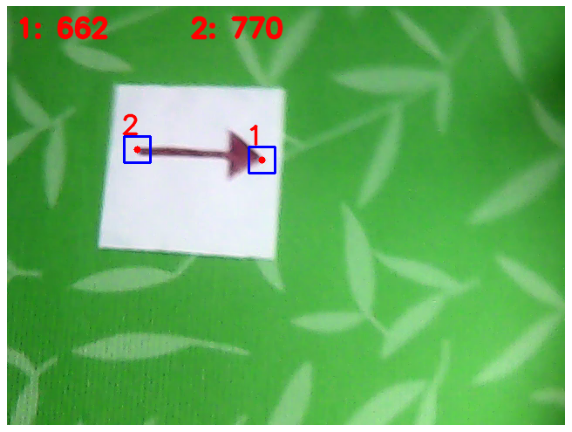

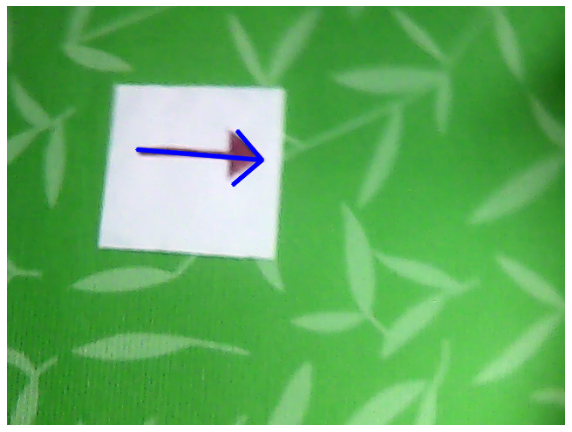

0 |-----------------------------------


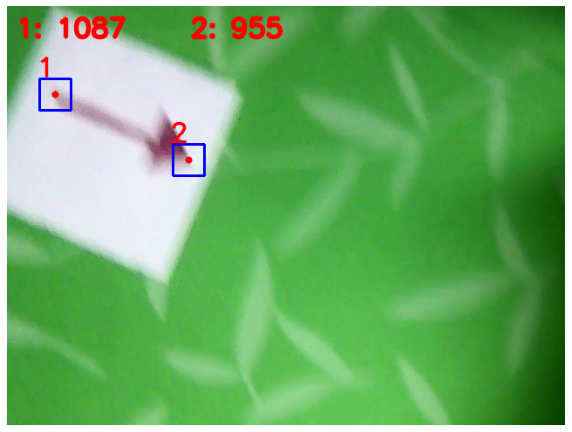

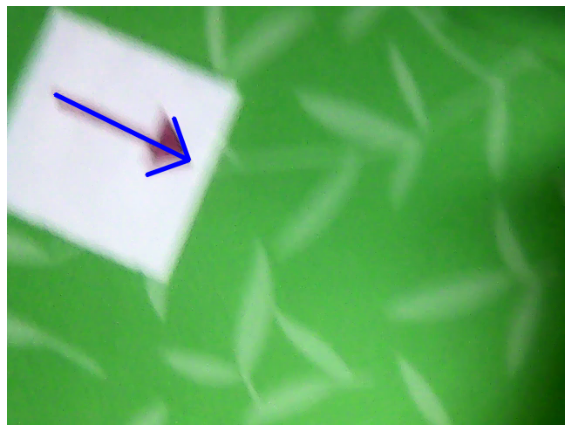

1 |-----------------------------------


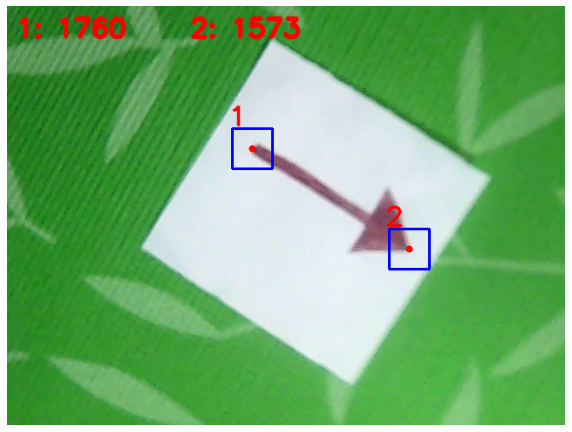

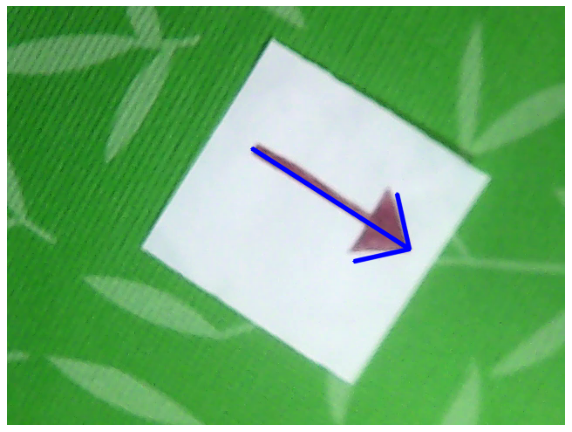

2 |-----------------------------------


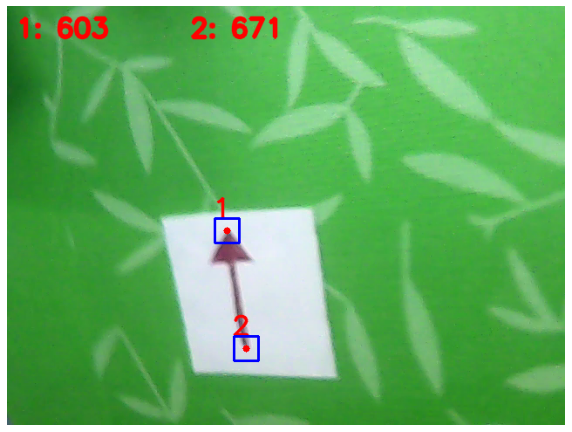

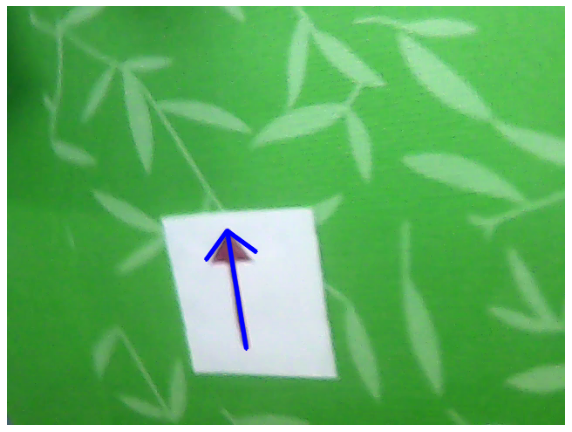

3 |-----------------------------------


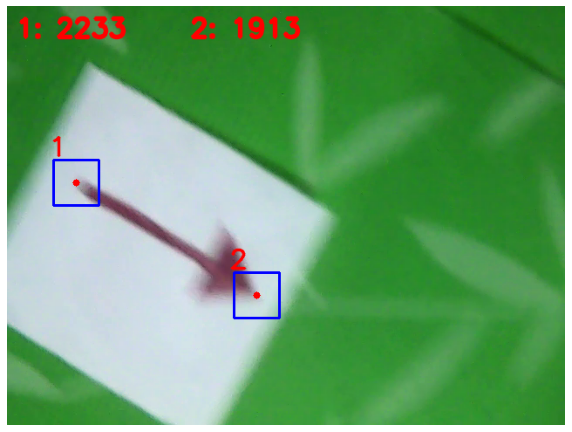

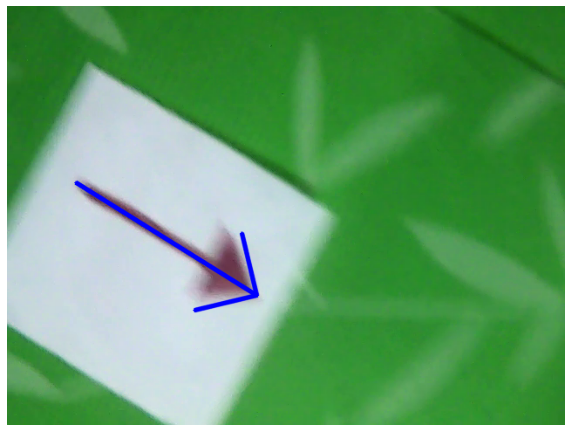

4 |-----------------------------------


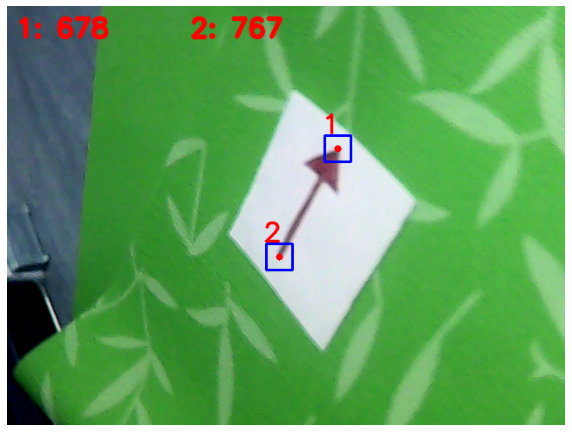

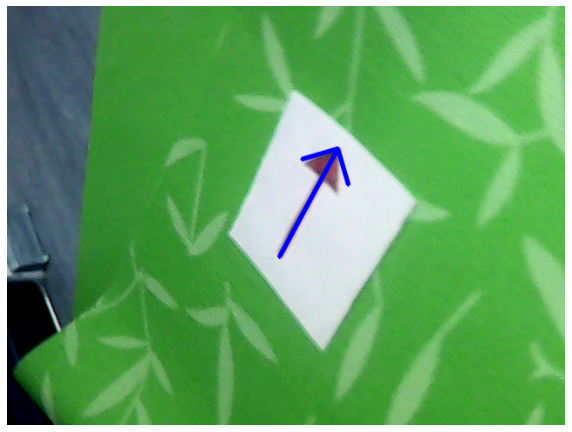

5 |-----------------------------------


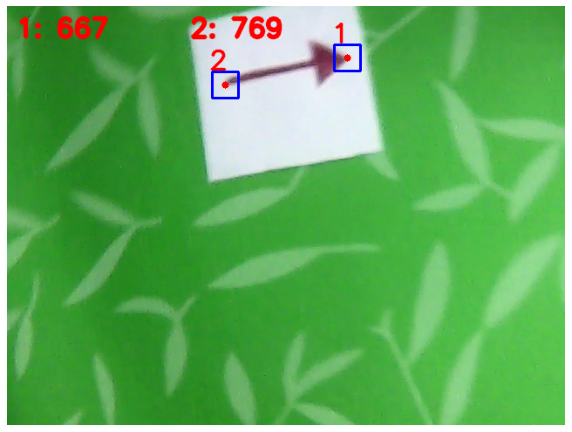

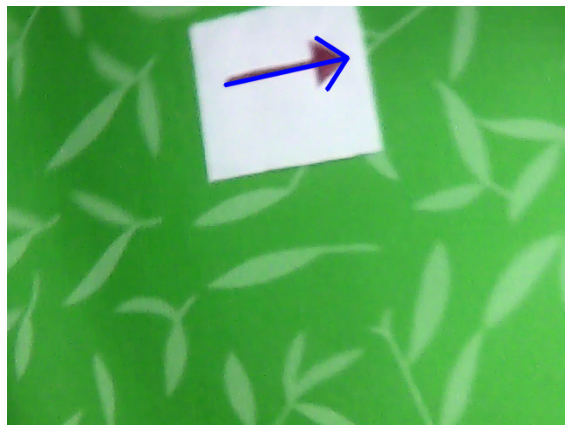

6 |-----------------------------------


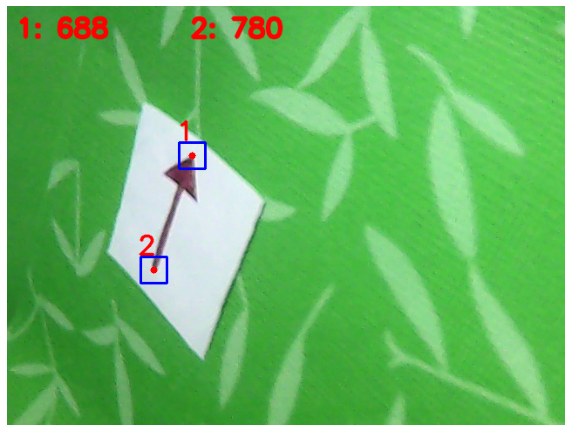

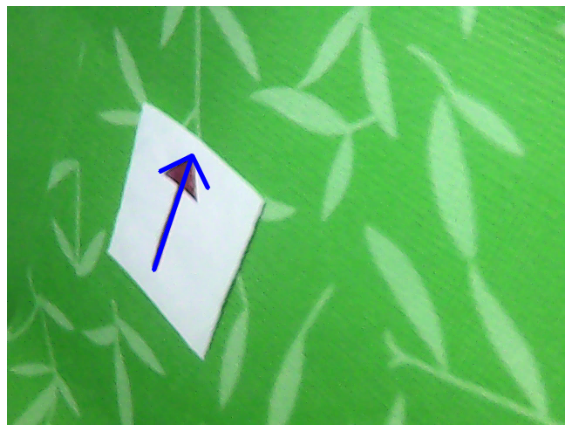

7 |-----------------------------------
Can't find contours
Cant find arrow
8 |-----------------------------------


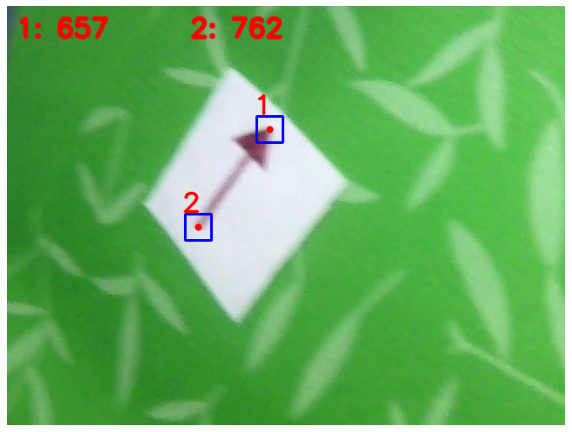

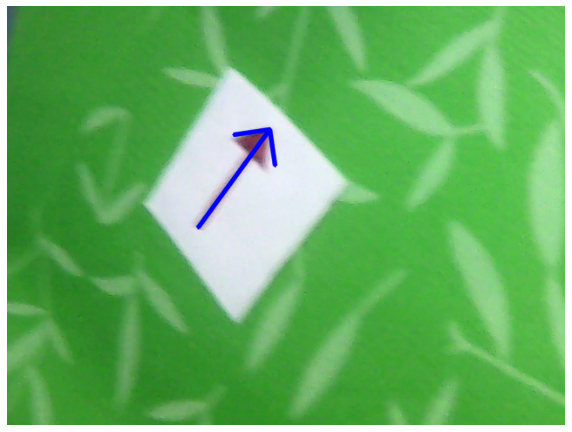

9 |-----------------------------------


In [23]:
i = 0
for image in images:
    canvas = image.copy()
    arrow = find_arrow(canvas.copy(), True)
    
    if arrow:
        drawArrow(canvas, arrow, (0,0,255), 3)
        show(canvas)
    else:
        print("Cant find arrow")
    
    print(str(i)+ " |-----------------------------------")
    i+=1